In [47]:

import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt




In [48]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=25

In [49]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 6271 files belonging to 4 classes.


In [50]:
class_names = dataset.class_names
class_names

['Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Septoria_leaf_spot',
 'Tomato_healthy']

In [51]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[3 1 2 1 1 0 2 1 2 1 3 1 0 1 1 0 2 3 0 0 3 3 3 1 0 0 0 3 2 2 1 1]


(32, 256, 256, 3)
[3 3 2 0 2 0 1 1 2 0 2 3 3 1 2 2 2 3 2 2 2 3 0 1 3 1 3 2 1 3 2 1]


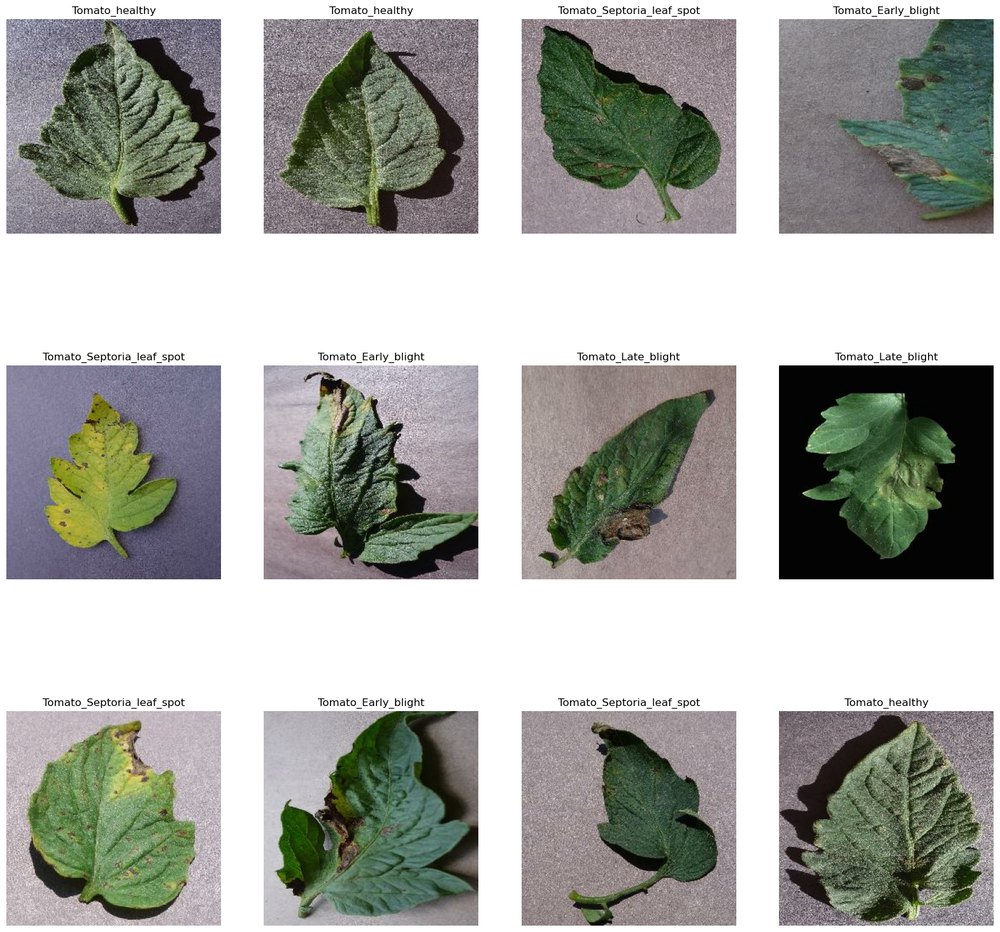

In [52]:
plt.figure(figsize=(20,20))
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())
    for i in range(12):
      ax=plt.subplot(3,4,i+1)

      plt. imshow(image_batch[i].numpy().astype("uint8"))
      plt.title(class_names[labels_batch[i]])
      plt.axis("off")

In [ ]:
info = """
80% ==> Training
20% ==> test
10% ==> Validation
10% ==> Test
"""
print(info)


80% ==> Training
20% ==> test
10% ==> Validation
10% ==> Test



In [54]:
len(dataset)

196

In [55]:
train_size=0.8
len(dataset)*train_size

156.8

In [56]:
train_ds=dataset.take(120)
len(train_ds)

120

In [57]:
test_ds=dataset.skip(120)
len(test_ds)

76

In [58]:
val_size=0.1
len(dataset)*val_size

19.6

In [59]:
val_ds=test_ds.take(15)
len(val_ds)

15

In [60]:
test_ds=test_ds.skip(15)
len(test_ds)

61

In [61]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [62]:
train_ds, val_ds, test_ds=get_dataset_partitions_tf(dataset)

In [63]:
len(train_ds)

156

In [64]:
len(val_ds)

19

In [65]:
len(test_ds)

21

In [66]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [67]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].numpy()/255)

[[[0.36078432 0.28627452 0.30980393]
  [0.38039216 0.30588236 0.32941177]
  [0.3882353  0.3137255  0.3372549 ]
  ...
  [0.43137255 0.37254903 0.4       ]
  [0.43137255 0.37254903 0.4       ]
  [0.43529412 0.3764706  0.40392157]]

 [[0.36862746 0.29411766 0.31764707]
  [0.39607844 0.32156864 0.34509805]
  [0.4117647  0.3372549  0.36078432]
  ...
  [0.4392157  0.38039216 0.40784314]
  [0.4392157  0.38039216 0.40784314]
  [0.44705883 0.3882353  0.41568628]]

 [[0.38039216 0.30588236 0.32941177]
  [0.40784314 0.33333334 0.35686275]
  [0.41960785 0.34509805 0.36862746]
  ...
  [0.44313726 0.38431373 0.4117647 ]
  [0.44313726 0.38431373 0.4117647 ]
  [0.44705883 0.3882353  0.41568628]]

 ...

 [[0.5372549  0.4745098  0.5137255 ]
  [0.5254902  0.4627451  0.5019608 ]
  [0.5176471  0.45490196 0.49411765]
  ...
  [0.6156863  0.5568628  0.58431375]
  [0.6117647  0.5529412  0.5803922 ]
  [0.60784316 0.54901963 0.5764706 ]]

 [[0.5411765  0.47843137 0.5176471 ]
  [0.53333336 0.47058824 0.50980395]


In [68]:


resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1.0 / 255)
])


In [69]:
#resize_and_rescale=tf.keras.Sequential([
   #layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    #layers.experimental.preprocessing.Rescaling(1./255),
#])

In [70]:
#data_augmentation=tf.keras.Sequential([
 #   layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  #  layers.experimental.preprocessing.RandomRotation(0.2),
#]
 #)

In [71]:
data_augmentation=tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
]
 )

In [72]:
train_ds=train_ds.map(
    lambda x,y: (data_augmentation(x, training=True),y)
).prefetch(buffer_size=tf.data.AUTOTUNE)


In [ ]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 4

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [74]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)            │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (32, 254, 254, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (32, 127, 127, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (32, 125, 125, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (32, 62, 62, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (32, 60, 60, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (32, 30, 30, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (32, 28, 28, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (32, 14, 14, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (32, 12, 12, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (32, 6, 6, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (32, 4, 4, 64)              │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (32, 2, 2, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (32, 64)                    │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (32, 4)                     │             260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,812 (718.02 KB)

 Trainable params: 183,812 (718.02 KB)

 Non-trainable params: 0 (0.00 B)

In [75]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [76]:
#import tensorflow as tf

# Example: remap labels from 0-9 to 0-2 (3 classes)
#label_mapping = tf.constant([0, 0, 1, 1, 2, 2, 0, 1, 2, 2])

# Remap the labels in the dataset
#train_ds = train_ds.map(lambda x, y: (x, tf.gather(label_mapping, y)))
#val_ds = val_ds.map(lambda x, y: (x, tf.gather(label_mapping, y)))


In [93]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=25,
)

Epoch 1/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - accuracy: 0.6315 - loss: 0.8560 - val_accuracy: 0.4737 - val_loss: 1.1431
Epoch 2/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 270s 2s/step - accuracy: 0.7084 - loss: 0.6909 - val_accuracy: 0.6711 - val_loss: 0.8221
Epoch 3/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 424s 3s/step - accuracy: 0.8192 - loss: 0.4675 - val_accuracy: 0.7911 - val_loss: 0.6213
Epoch 4/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 1021s 7s/step - accuracy: 0.8512 - loss: 0.3773 - val_accuracy: 0.8520 - val_loss: 0.4512
Epoch 5/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 361s 2s/step - accuracy: 0.8704 - loss: 0.3387 - val_accuracy: 0.8224 - val_loss: 0.5320
Epoch 6/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 1150s 7s/step - accuracy: 0.8872 - loss: 0.2981 - val_accuracy: 0.8750 - val_loss: 0.3532
Epoch 7/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 348s 2s/step - accuracy: 0.9000 - loss: 0.2641 - val_accuracy: 0.8882 - val_loss: 0.3187
Epoch 8/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 910s 6s/step - accuracy: 0.9070 - loss: 0.2388 - val_ac

In [94]:
#train_ds = train_ds.map(lambda x, y: (x, y - 1))
#val_ds = val_ds.map(lambda x, y: (x, y - 1))


In [95]:
#train_ds = train_ds.map(lambda x, y: (x, y - 1))
#val_ds = val_ds.map(lambda x, y: (x, y - 1))


In [96]:
#train_ds = train_ds.map(lambda x, y: (x, y - 1))
#val_ds = val_ds.map(lambda x, y: (x, y - 1))


In [97]:
len(test_ds)

21

In [98]:
scores=model.evaluate(test_ds)

21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 496ms/step - accuracy: 0.9325 - loss: 0.2006


In [99]:
scores

[0.21103200316429138, 0.925595223903656]

In [100]:
history

In [101]:
history.params

{'verbose': 1, 'epochs': 25, 'steps': 156}

In [102]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [103]:
history.history['loss']

[0.814012348651886,
 0.6207770109176636,
 0.4847985506057739,
 0.3685641586780548,
 0.33600082993507385,
 0.3015563189983368,
 0.29692474007606506,
 0.2377714216709137,
 0.27433159947395325,
 0.2197926789522171,
 0.21319745481014252,
 0.209512397646904,
 0.16985782980918884,
 0.1760193109512329,
 0.16014687716960907,
 0.1400929093360901,
 0.12045887857675552,
 0.14973986148834229,
 0.11939708143472672,
 0.12742017209529877,
 0.11723437160253525,
 0.11692240089178085,
 0.09893341362476349,
 0.10642344504594803,
 0.16569386422634125]

In [104]:
len(history.history['loss'])

25

In [105]:
len(history.history['accuracy'])

25

In [106]:
history.history['accuracy']

[0.6539771556854248,
 0.7427369356155396,
 0.8148667812347412,
 0.8567421436309814,
 0.8705670237541199,
 0.8869965672492981,
 0.8841915726661682,
 0.9096373319625854,
 0.8954117298126221,
 0.9198557138442993,
 0.9164496064186096,
 0.9314766526222229,
 0.9398918151855469,
 0.9352834820747375,
 0.9430975914001465,
 0.947505533695221,
 0.9575235247612,
 0.9473051428794861,
 0.9587256908416748,
 0.9579242467880249,
 0.9563213586807251,
 0.9609296917915344,
 0.964135468006134,
 0.9597275257110596,
 0.9408935904502869]

In [107]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

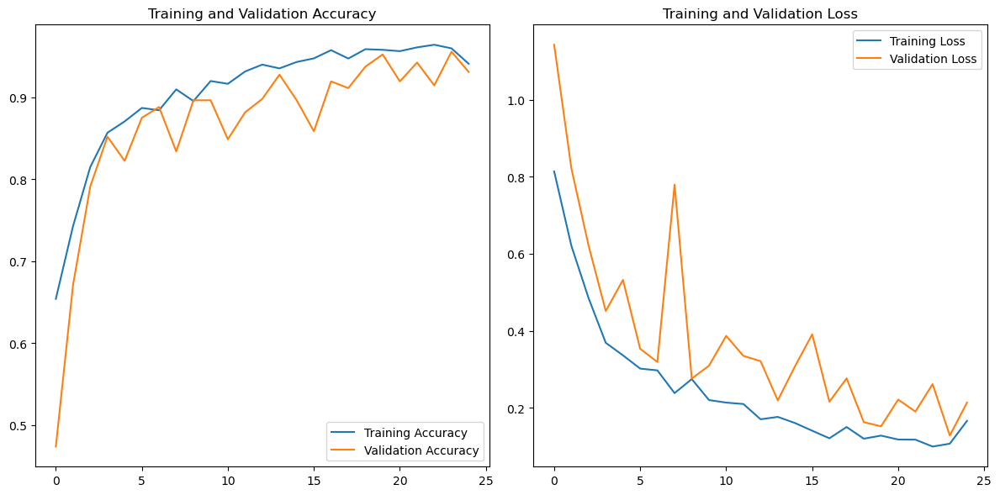

In [108]:
plt.figure(figsize=(12, 6))  # Increase the figure size for better readability

# Plot for accuracy
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plot for loss
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.tight_layout()  # Automatically adjust spacing to prevent overlap
plt.show()


FIrst image to predict
Actual label: Tomato_healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted label: Tomato_healthy


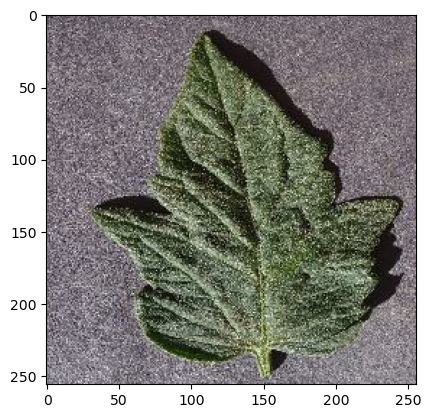

In [109]:
import numpy as np

for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")

    print("FIrst image to predict")

    plt.imshow(first_image)

    print("Actual label:",class_names[labels_batch[0].numpy()])

    batch_prediction=model.predict(images_batch)
    print("Predicted label:",class_names[np.argmax(batch_prediction[0])])


In [110]:
def predict(model, img):
    img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy)
    img_array=tf.expand_dims(img_array,0)

    prediction=model.predict(img_array)

    predicted_class=class_names[np.argmax(predictions[0])]
    confidence=round(100*(np.max(predictions[0])),2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


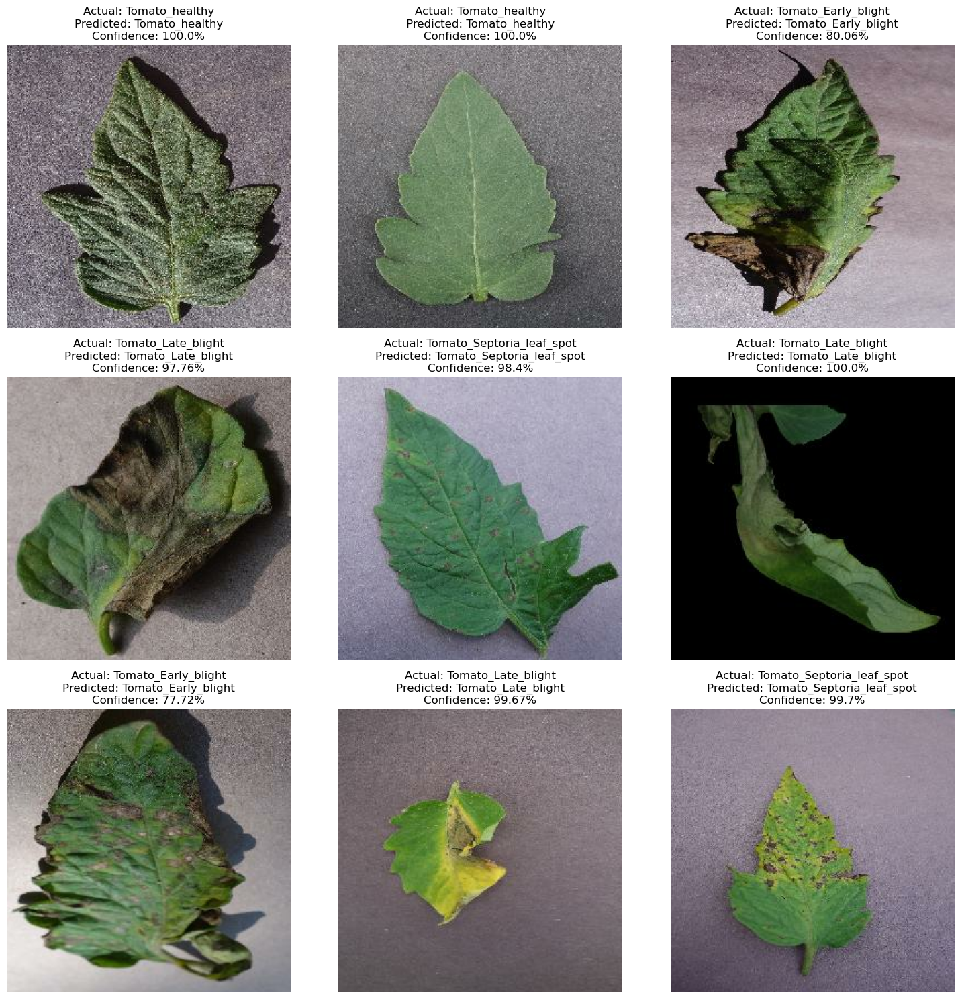

In [114]:
plt.figure(figsize=(15,15))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))  # Convert to uint8 for display

    # Get the actual class
    actual_class = class_names[labels_batch[i]]

    # Predict the class
    predictions = model.predict(images_batch[i][tf.newaxis, ...])  # Add batch dimension
    predicted_class_index = tf.argmax(predictions[0]).numpy()
    predicted_class = class_names[predicted_class_index]
    confidence = round(100 * tf.reduce_max(predictions[0]).numpy(), 2)

    # Set the title
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%")
    plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
import os

print(os.listdir("../models"))  # Now this won't throw an error


['1.h5']


In [ ]:
import os
import tensorflow as tf

# Ensure the directory exists
os.makedirs("../models", exist_ok=True)

# Extract numeric parts of filenames in the directory
max_version = max([int(i) for i in os.listdir("../models") if i.isdigit()] + [0]) + 1
print(f"Next model version: {max_version}")

# Assign model_version before saving
model_version = max_version

# Define and compile the model properly
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(10,)),  # Explicit input layer
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Example output layer
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Save the model
model.save(f"../models/{model_version}.keras")  # Recommended format
model.save(f"../models/{model_version}.h5")  # Legacy format (causes warning)


Next model version: 1


In [ ]:
import os
print(os.listdir("../models"))


Found 6271 files belonging to 4 classes.
Class Names: ['Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Septoria_leaf_spot', 'Tomato_healthy']


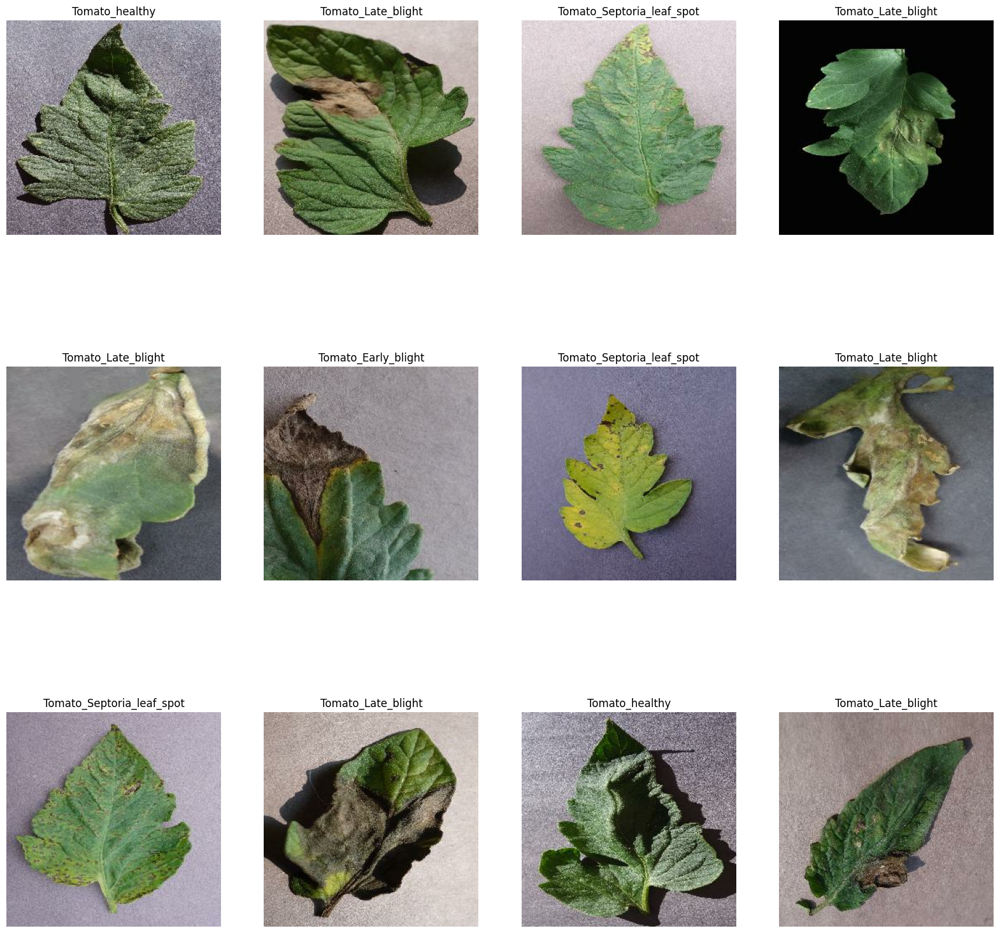

Next model version: 1


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 123008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    15,745,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,765,924 (60.14 MB)

 Trainable params: 15,765,924 (60.14 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 226s 1s/step - accuracy: 0.3835 - loss: 2.3195 - val_accuracy: 0.5789 - val_loss: 1.1410
Epoch 2/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 200s 1s/step - accuracy: 0.6349 - loss: 0.8938 - val_accuracy: 0.6595 - val_loss: 0.8744
Epoch 3/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 202s 1s/step - accuracy: 0.7191 - loss: 0.7163 - val_accuracy: 0.7944 - val_loss: 0.6095
Epoch 4/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.7799 - loss: 0.5663 - val_accuracy: 0.7862 - val_loss: 0.6061
Epoch 5/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 195s 1s/step - accuracy: 0.8099 - loss: 0.4791 - val_accuracy: 0.8388 - val_loss: 0.4320
Epoch 6/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.8424 - loss: 0.3891 - val_accuracy: 0.8076 - val_loss: 0.6203
Epoch 7/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - accuracy: 0.8658 - loss: 0.3534 - val_accuracy: 0.8224 - val_loss: 0.6405
Epoch 8/25
156/156 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8729 - loss: 0.3131 - val_accu

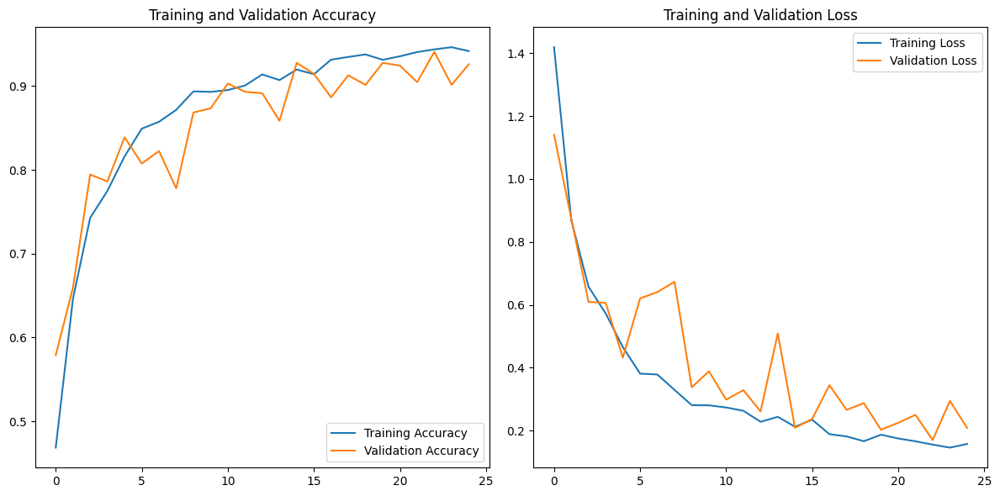

First Image to Predict
Actual Label: Tomato_Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
Predicted Label: Tomato_Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


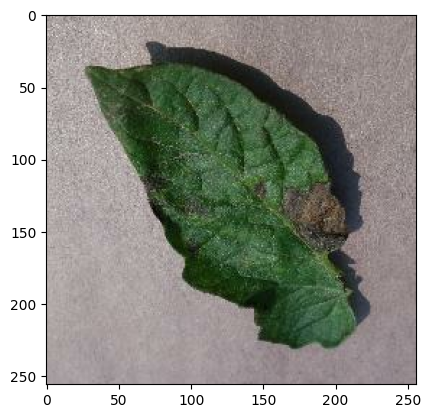

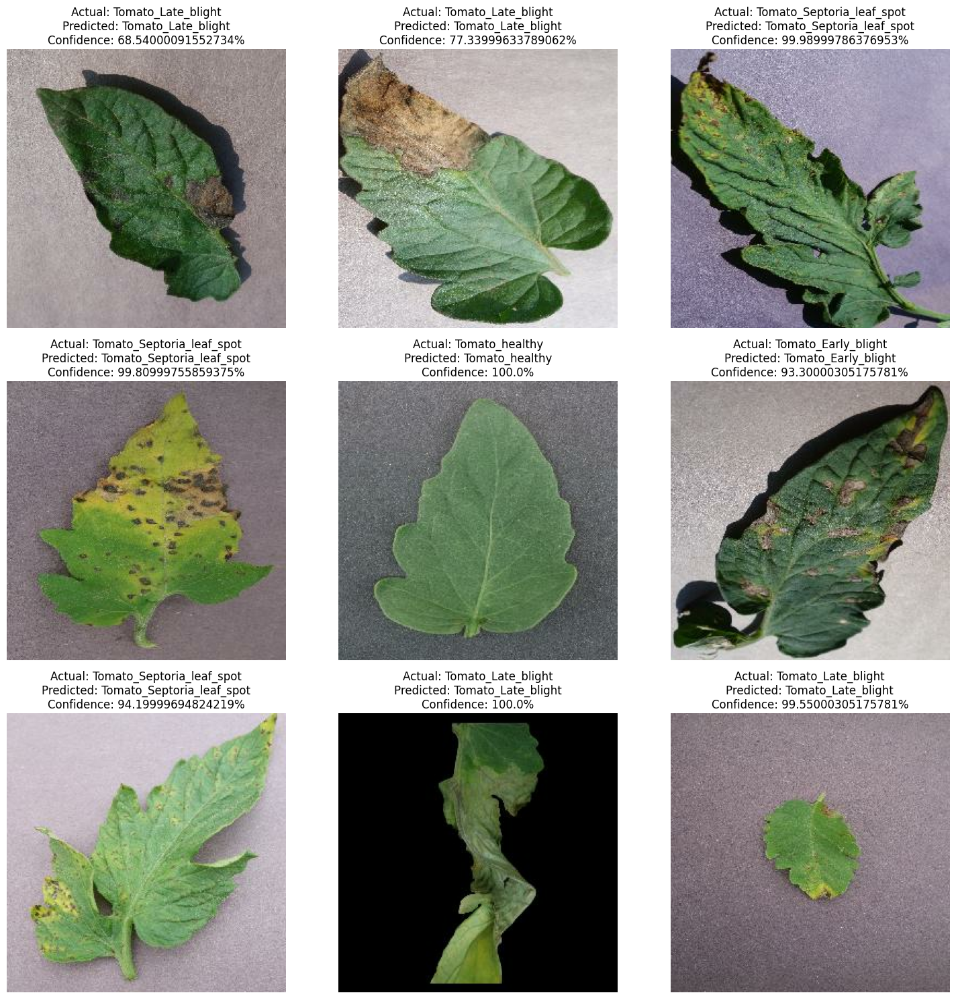

Saved Models: ['1.h5', '1.keras']


In [7]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models

# Constants
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS = 3
EPOCHS = 25

# Ensure model save directory exists
os.makedirs("../models1", exist_ok=True)

# Load Dataset
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    r"C:\Users\ruchi\Downloads\final_Tomato\PlantVillage",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

# Get class names
class_names = dataset.class_names
print("Class Names:", class_names)

# Display some images from dataset
plt.figure(figsize=(20, 20))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")
plt.show()

# Split Dataset
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + val_split + test_split) == 1
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

# Optimize dataset loading
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# Data Preprocessing (Resizing and Rescaling)
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1.0 / 255)
])

# Data Augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

# Apply augmentation to training data
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y)).prefetch(buffer_size=tf.data.AUTOTUNE)

# Extract numeric parts of filenames in the directory
max_version = max([int(i) for i in os.listdir("../models") if i.isdigit()] + [0]) + 1
print(f"Next model version: {max_version}")

# Define and compile the model
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    resize_and_rescale,
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(len(class_names), activation='softmax')  # Multi-class classification
])

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# Display model summary
model.summary()

# Train the model
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    verbose=1
)

# Evaluate the model
scores = model.evaluate(test_ds)
print(f"Test Accuracy: {scores[1] * 100:.2f}%")

# Save the trained model
model.save(f"../models1/{max_version}.keras")  # Recommended format
model.save(f"../models1/{max_version}.h5")  # Legacy format

# Plot Accuracy and Loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 6))

# Plot for Accuracy
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plot for Loss
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

# Predict and Display Results
for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    
    print("First Image to Predict")
    plt.imshow(first_image)
    
    print("Actual Label:", class_names[labels_batch[0].numpy()])

    batch_prediction = model.predict(images_batch)
    print("Predicted Label:", class_names[np.argmax(batch_prediction[0])])

# Prediction Function
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  # Expand dimensions for batch
    
    prediction = model.predict(img_array)
    predicted_class = class_names[np.argmax(prediction[0])]
    confidence = round(100 * np.max(prediction[0]), 2)
    
    return predicted_class, confidence

# Display Predictions
plt.figure(figsize=(15, 15))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images_batch[i].numpy().astype("uint8"))
    
    actual_class = class_names[labels_batch[i]]
    
    predictions = model.predict(images_batch[i][tf.newaxis, ...])
    predicted_class_index = np.argmax(predictions[0])
    predicted_class = class_names[predicted_class_index]
    confidence = round(100 * np.max(predictions[0]), 2)
    
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Print saved models in directory
print("Saved Models:", os.listdir("../models1"))


In [2]:
!pip install matplotlib


   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   - -------------------------------------- 0.3/8.1 MB ? eta -:--:--
   -- ------------------------------------- 0.5/8.1 MB 1.7 MB/s eta 0:00:05
   --- ------------------------------------ 0.8/8.1 MB 1.8 MB/s eta 0:00:05
   ------- -------------------------------- 1.6/8.1 MB 2.0 MB/s eta 0:00:04
   ---------- ----------------------------- 2.1/8.1 MB 2.2 MB/s eta 0:00:03
   -------------- ------------------------- 2.9/8.1 MB 2.5 MB/s eta 0:00:03
   ------------------ --------------------- 3.7/8.1 MB 2.7 MB/s eta 0:00:02
   ------------------------ --------------- 5.0/8.1 MB 3.2 MB/s eta 0:00:01
   ----------------------------- ---------- 6.0/8.1 MB 3.5 MB/s eta 0:00:01
   ----------------------------------- ---- 7.1/8.1 MB 3.6 MB/s eta 0:00:01
   ---------------------------------------- 8.1/8.1 MB 3.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   ---------------------------- -